In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import cdist

import os

/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_

In [2]:
# corrected_rna_adata_path = '/home/minhang/mds_project/data/cohort_adata/multiVI_model/adata_multivi_corrected_rna.h5ad'
# batch_corrected_adata = sc.read_h5ad(corrected_rna_adata_path)

In [3]:
# check dtype of batch_corrected_adata.X
#   print(f"Batch corrected adata X dtype: {batch_corrected_adata.X.dtype}")

In [4]:
PREPROCESSED_ADATA_PATH = '/home/minhang/mds_project/data/cohort_adata/multiVI_model/adata_mrd_hvg_std_may31.h5ad'
# mrd_rna_std_adata = sc.read_h5ad(mrd_rna_adata_path)

In [5]:
def random_downsample(adata_donor, cell_type_col, target_fraction=0.5, min_cells_per_type=5, random_state=42):
    """
    Randomly downsamples cells within each cell type in adata_donor.
    
    Parameters:
    - adata_donor: AnnData object containing only donor cells.
    - cell_type_col: Column in adata_donor.obs identifying cell types.
    - target_fraction: Fraction of cells to keep for each type.
    - min_cells_per_type: Minimum number of cells to keep if a type is very small.
    - random_state: Random seed for reproducibility.
    
    Returns:
    - DataFrame or Series: Boolean mask for adata_donor.obs.index indicating kept cells.
    """
    np.random.seed(random_state)
    kept_indices = []
    for cell_type in adata_donor.obs[cell_type_col].unique():
        type_adata = adata_donor[adata_donor.obs[cell_type_col] == cell_type]
        n_cells_type = type_adata.n_obs
        n_to_keep = max(min_cells_per_type, int(n_cells_type * target_fraction))
        if n_to_keep >= n_cells_type:
            kept_indices.extend(type_adata.obs.index.tolist())
        else:
            chosen_indices = np.random.choice(type_adata.obs.index, size=n_to_keep, replace=False)
            kept_indices.extend(chosen_indices.tolist())
            
    return pd.Series(adata_donor.obs.index.isin(kept_indices), index=adata_donor.obs.index, name='random_kept')

In [6]:
def centroid_percentile_downsample(adata_donor, cell_type_col, distance_percentile_to_keep=75, 
                                   basis='X_multivi', min_cells_per_type=5):
    """
    Downsamples donor cells by keeping cells within a certain distance percentile from their cell type centroid.
    
    Parameters:
    - adata_donor: AnnData object containing only donor cells.
    - cell_type_col: Column in adata_donor.obs identifying cell types.
    - distance_percentile_to_keep: Percentile of distances from centroid to define the keep radius (0-100).
    - basis: Key in adata_donor.obsm to use for coordinate calculations (e.g., 'X_multivi').
    - min_cells_per_type: Minimum number of cells to keep if a type is very small.

    Returns:
    - DataFrame or Series: Boolean mask for adata_donor.obs.index indicating kept cells.
    """
    if basis not in adata_donor.obsm:
        raise ValueError(f"Basis '{basis}' not found in adata_donor.obsm.")

    kept_mask = pd.Series(False, index=adata_donor.obs.index)
    
    for cell_type in adata_donor.obs[cell_type_col].unique():
        type_mask = adata_donor.obs[cell_type_col] == cell_type
        type_coords = adata_donor[type_mask].obsm[basis]
        type_indices = adata_donor[type_mask].obs.index
        
        n_cells_type = type_coords.shape[0]
        if n_cells_type == 0:
            continue

        if n_cells_type <= min_cells_per_type: # Keep all if very few cells
            kept_mask[type_indices] = True
            continue

        centroid = np.mean(type_coords, axis=0).reshape(1, -1)
        distances = cdist(type_coords, centroid, metric='euclidean').ravel()
        
        if len(distances) > 0 :
            distance_threshold = np.percentile(distances, distance_percentile_to_keep)
            # Ensure we don't discard everything if all distances are identical (e.g. very few points)
            if distance_threshold == 0 and np.all(distances == 0) and distance_percentile_to_keep > 0 : # handle case of all points at centroid for small N
                 type_indices_to_keep = distances <= (np.max(distances) + 1e-9) # keep all if they are at centroid
            else:
                 type_indices_to_keep = distances <= distance_threshold

            # Apply min_cells_per_type logic again after filtering
            current_kept_indices = type_indices[type_indices_to_keep]
            if len(current_kept_indices) < min_cells_per_type and n_cells_type > min_cells_per_type :
                # If filtering results in too few cells, resort to keeping the 'min_cells_per_type' closest ones
                # Or, could take a random sample of size min_cells_per_type from the original type_indices
                # For simplicity, let's keep the closest ones if percentile was too strict
                sorted_dist_indices = type_indices[np.argsort(distances)]
                current_kept_indices = sorted_dist_indices[:min_cells_per_type]

            kept_mask[current_kept_indices] = True
        elif n_cells_type > 0: # if no distances but cells exist (e.g. 1 cell)
            kept_mask[type_indices] = True


    return pd.Series(kept_mask, name='centroid_percentile_kept')

In [7]:
def density_biased_downsample(adata_donor, cell_type_col, target_fraction=0.5, 
                              k_neighbors=10, density_power=1.0, 
                              basis='X_multivi', min_cells_per_type=5, random_state=42):
    """
    Downsamples donor cells, biasing towards keeping cells in sparser regions.
    P(keep_i) is proportional to (distance_to_kth_neighbor_i)^density_power.
    
    Parameters:
    - adata_donor: AnnData object containing only donor cells.
    - cell_type_col: Column in adata_donor.obs identifying cell types.
    - target_fraction: Approximate fraction of cells to keep for each type.
    - k_neighbors: Number of neighbors for KNN distance (sparsity proxy).
    - density_power: Exponent for weighting by sparsity. Higher values give stronger bias to sparse.
    - basis: Key in adata_donor.obsm to use for coordinates.
    - min_cells_per_type: Minimum number of cells to keep.
    - random_state: Random seed.

    Returns:
    - DataFrame or Series: Boolean mask for adata_donor.obs.index indicating kept cells.
    """
    np.random.seed(random_state)
    if basis not in adata_donor.obsm:
        raise ValueError(f"Basis '{basis}' not found in adata_donor.obsm.")

    kept_indices_global = []

    for cell_type in adata_donor.obs[cell_type_col].unique():
        type_adata = adata_donor[adata_donor.obs[cell_type_col] == cell_type]
        type_coords = type_adata.obsm[basis]
        type_indices = type_adata.obs.index
        n_cells_type = type_coords.shape[0]

        if n_cells_type == 0:
            continue
        
        n_to_keep = max(min_cells_per_type, int(n_cells_type * target_fraction))

        if n_to_keep >= n_cells_type:
            kept_indices_global.extend(type_indices.tolist())
            continue
        
        # Ensure k_neighbors is not larger than number of samples - 1
        current_k = min(k_neighbors, n_cells_type - 1)
        if current_k < 1: # Not enough cells to calculate KNN distance meaningfully
            chosen_indices = np.random.choice(type_indices, size=n_to_keep, replace=False)
            kept_indices_global.extend(chosen_indices.tolist())
            continue

        # Calculate distance to k-th nearest neighbor for each cell WITHIN its type
        nn = NearestNeighbors(n_neighbors=current_k + 1, algorithm='auto') # +1 because a point is its own 0th neighbor
        nn.fit(type_coords)
        distances_kth_neighbor, _ = nn.kneighbors(type_coords)
        
        # Use distance to the k-th neighbor (index k, as 0 is self)
        # If current_k is 0 (only 1 point), this will fail. Handled above.
        sparsity_metric = distances_kth_neighbor[:, current_k] 

        # Add small epsilon to avoid zero weights if all distances are zero (highly unlikely with real data)
        weights = (sparsity_metric + 1e-9) ** density_power
        
        if np.sum(weights) == 0: # All weights are zero, fallback to random
             chosen_indices = np.random.choice(type_indices, size=n_to_keep, replace=False)
        else:
            probabilities = weights / np.sum(weights)
            chosen_indices = np.random.choice(type_indices, size=n_to_keep, replace=False, p=probabilities)
        
        kept_indices_global.extend(chosen_indices.tolist())
        
    return pd.Series(adata_donor.obs.index.isin(kept_indices_global), index=adata_donor.obs.index, name='density_biased_kept')


In [8]:
def plot_downsampling_effect_umap(adata_patient_subset, # AnnData for the current patient
                                  all_donors_in_subset_mask, # Boolean mask: True for all donor cells in adata_patient_subset
                                  kept_donors_mask_on_donor_subset, # Boolean mask (aligned with original donor subset) indicating which were kept
                                  cell_type_col, umap_basis='X_umap', title_suffix="", 
                                  palette=None, point_size=10,
                                  ax_to_plot_on=None, # New: Pass an Axes object here
                                  show_legend=True):  # New: Control legend visibility
    
    # Determine which Axes to use
    if ax_to_plot_on is None:
        fig, current_ax = plt.subplots(figsize=(12, 9)) # Default for standalone plot
        fig.patch.set_facecolor('white')
    else:
        current_ax = ax_to_plot_on
        fig = current_ax.get_figure() # Get the parent figure

    if umap_basis not in adata_patient_subset.obsm:
        print(f"UMAP basis '{umap_basis}' not found in patient AnnData. Cannot plot.")
        if ax_to_plot_on is None: return fig # Return fig if created here
        return # Otherwise just return

    # Mask for recipients within the current patient subset
    recipient_cell_mask_in_subset = ~all_donors_in_subset_mask
    
    # Create a final mask for kept donors, aligned with adata_patient_subset.obs.index
    # kept_donors_mask_on_donor_subset is a boolean Series where index = original donor cell indices
    # and value = True if that donor cell was kept.
    final_kept_donor_mask_in_subset = pd.Series(False, index=adata_patient_subset.obs.index)
    # Get the actual cell barcodes (indices) of donor cells that were marked as 'kept'
    kept_donor_cell_indices = kept_donors_mask_on_donor_subset.index[kept_donors_mask_on_donor_subset]
    # Ensure these indices are valid for the current patient subset anndata before assigning
    valid_kept_donor_indices_for_subset = adata_patient_subset.obs.index.intersection(kept_donor_cell_indices)
    final_kept_donor_mask_in_subset.loc[valid_kept_donor_indices_for_subset] = True
    
    # Removed donors are those in 'all_donors_in_subset_mask' but NOT in 'final_kept_donor_mask_in_subset'
    removed_donor_mask_in_subset = all_donors_in_subset_mask & (~final_kept_donor_mask_in_subset)

    unique_cell_types = sorted(adata_patient_subset.obs[cell_type_col].astype(str).unique())
    if palette is None: # Ensure consistent palette if called multiple times for subplots
        default_colors = plt.cm.get_cmap('tab20' if len(unique_cell_types) <= 20 else 'viridis', len(unique_cell_types))
        palette = {ctype: default_colors(i) for i, ctype in enumerate(unique_cell_types)}

    # 1. Plot removed donor cells
    adata_removed_donors = adata_patient_subset[removed_donor_mask_in_subset]
    for cell_type in unique_cell_types:
        type_mask = adata_removed_donors.obs[cell_type_col] == cell_type
        if type_mask.sum() > 0:
            current_ax.scatter(adata_removed_donors[type_mask].obsm[umap_basis][:, 0],
                               adata_removed_donors[type_mask].obsm[umap_basis][:, 1],
                               color=palette.get(cell_type, 'grey'), alpha=0.1, s=point_size, ec='none')

    # 2. Plot kept donor cells
    adata_kept_donors = adata_patient_subset[final_kept_donor_mask_in_subset]
    for cell_type in unique_cell_types:
        type_mask = adata_kept_donors.obs[cell_type_col] == cell_type
        if type_mask.sum() > 0:
            current_ax.scatter(adata_kept_donors[type_mask].obsm[umap_basis][:, 0],
                               adata_kept_donors[type_mask].obsm[umap_basis][:, 1],
                               color=palette.get(cell_type, 'grey'), alpha=0.7, s=point_size + 5, 
                               edgecolor='black', linewidth=0.3)

    # 3. Plot recipient cells
    adata_recipients = adata_patient_subset[recipient_cell_mask_in_subset]
    for cell_type in unique_cell_types:
        type_mask = adata_recipients.obs[cell_type_col] == cell_type
        if type_mask.sum() > 0:
            current_ax.scatter(adata_recipients[type_mask].obsm[umap_basis][:, 0],
                               adata_recipients[type_mask].obsm[umap_basis][:, 1],
                               color=palette.get(cell_type, 'grey'), alpha=0.9, s=point_size + 10, 
                               marker='X', edgecolor='black', linewidth=0.5)
    
    current_ax.set_xlabel("UMAP1", fontsize=10) # Adjusted fontsize for subplots
    current_ax.set_ylabel("UMAP2", fontsize=10) # Adjusted fontsize
    current_ax.set_title(title_suffix, fontsize=11) # Use title_suffix directly as subplot title
    current_ax.set_xticks([])
    current_ax.set_yticks([])
    current_ax.grid(False)

    if show_legend:
        legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=ctype,
                                   markerfacecolor=palette.get(ctype, 'grey'), markersize=8) 
                          for ctype in unique_cell_types]
        legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', label='Donor (Removed)', 
                                         markerfacecolor='grey', alpha=0.1, markersize=8))
        legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', label='Donor (Kept)', 
                                         markerfacecolor='grey', alpha=0.7, markersize=8, markeredgecolor='black'))
        legend_handles.append(plt.Line2D([0], [0], marker='X', color='w', label='Recipient', 
                                         markerfacecolor='grey', alpha=0.9, markersize=8, markeredgecolor='black'))
        
        current_ax.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=8, title="Legend")

    if ax_to_plot_on is None: # If it was a standalone call that created its own figure
        plt.tight_layout(rect=[0, 0, 0.82, 1]) # Adjust for legend if shown
        return fig 

In [9]:
PATIENT_COL = 'patient'
DONOR_RECIPIENT_COL = 'source' # e.g., 'donor', 'recipient'
DONOR_LABEL = 'donor'
RECIPIENT_LABEL = 'recipient'
CELL_TYPE_COL = 'predicted.annotation' # Or your actual cell type annotation column
MULTIVI_BASIS = 'X_multivi'
UMAP_BASIS = 'X_umap' # Ensure this exists from your multiVI UMAP

In [10]:
# Downsampling parameters (can be adjusted per patient if needed)
DEFAULT_TARGET_DONOR_FRACTION = 0.5 # Default if no recipients or if very imbalanced
TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD = 10.0 # e.g., if D/R > 2.0, consider downsampling
MIN_CELLS_PER_TYPE_AFTER_DOWNSAMPLE = 20 # Minimum cells to keep for any donor cell type
CENTROID_DISTANCE_PERCENTILE = 25 # For centroid method
DENSITY_K_NEIGHBORS = 10
DENSITY_POWER = 1.0

In [11]:
PLOT_OUTPUT_DIR = "downsampling_plots_per_patient"
os.makedirs(PLOT_OUTPUT_DIR, exist_ok=True)

In [12]:
# --- Downsampling Functions (from previous response, ensure they are defined) ---
def random_downsample(adata_donor, cell_type_col, target_fraction=0.5, min_cells_per_type=5, random_state=42):
    np.random.seed(random_state)
    kept_indices = []
    for cell_type in adata_donor.obs[cell_type_col].unique():
        type_adata = adata_donor[adata_donor.obs[cell_type_col] == cell_type]
        n_cells_type = type_adata.n_obs
        
        # Calculate number to keep based on fraction, but ensure it's at least min_cells_per_type
        n_to_keep_frac = int(n_cells_type * target_fraction)
        n_to_keep = max(min_cells_per_type, n_to_keep_frac)
        
        # But don't try to keep more than available, unless min_cells demands it and it's possible.
        n_to_keep = min(n_to_keep, n_cells_type) if n_cells_type > 0 else 0


        if n_to_keep > 0 :
            chosen_indices = np.random.choice(type_adata.obs.index, size=n_to_keep, replace=False)
            kept_indices.extend(chosen_indices.tolist())
            
    return pd.Series(adata_donor.obs.index.isin(kept_indices), index=adata_donor.obs.index, name='random_kept')

def centroid_percentile_downsample(adata_donor, cell_type_col, distance_percentile_to_keep=75, 
                                   basis='X_multivi', min_cells_per_type=5):
    if basis not in adata_donor.obsm:
        raise ValueError(f"Basis '{basis}' not found in adata_donor.obsm.")

    # Initialize mask for all donor cells passed to this function
    kept_mask_on_input_donors = pd.Series(False, index=adata_donor.obs.index)
    
    for cell_type in adata_donor.obs[cell_type_col].unique():
        type_mask_in_donors = adata_donor.obs[cell_type_col] == cell_type
        type_coords = adata_donor[type_mask_in_donors].obsm[basis]
        type_indices_in_donors = adata_donor.obs.index[type_mask_in_donors] # Get original indices
        
        n_cells_type = type_coords.shape[0]
        if n_cells_type == 0:
            continue

        # If n_cells_type is already less than or equal to min_cells_per_type, keep all.
        # Or if percentile is 100, keep all.
        if n_cells_type <= min_cells_per_type or distance_percentile_to_keep >= 100:
            kept_mask_on_input_donors[type_indices_in_donors] = True
            continue

        centroid = np.mean(type_coords, axis=0).reshape(1, -1)
        distances = cdist(type_coords, centroid, metric='euclidean').ravel()
        
        indices_to_keep_for_type = []
        if len(distances) > 0:
            distance_threshold = np.percentile(distances, distance_percentile_to_keep)
            
            # Indices (within type_coords/type_indices_in_donors) of cells satisfying distance threshold
            within_radius_mask = distances <= distance_threshold
            
            # Ensure at least min_cells_per_type are kept if possible, by taking closest ones
            if np.sum(within_radius_mask) < min_cells_per_type and n_cells_type >= min_cells_per_type :
                # Sort by distance and take the top min_cells_per_type
                sorted_dist_local_indices = np.argsort(distances)
                local_indices_to_keep = sorted_dist_local_indices[:min_cells_per_type]
            else:
                local_indices_to_keep = np.where(within_radius_mask)[0]
            
            indices_to_keep_for_type = type_indices_in_donors[local_indices_to_keep]

        elif n_cells_type > 0: # e.g., only 1 cell, distance calc might be empty
            indices_to_keep_for_type = type_indices_in_donors
        
        kept_mask_on_input_donors[indices_to_keep_for_type] = True
        
    return pd.Series(kept_mask_on_input_donors, name='centroid_percentile_kept')


def density_biased_downsample(adata_donor, cell_type_col, target_fraction=0.5, 
                              k_neighbors=10, density_power=1.0, 
                              basis='X_multivi', min_cells_per_type=5, random_state=42):
    np.random.seed(random_state)
    if basis not in adata_donor.obsm:
        raise ValueError(f"Basis '{basis}' not found in adata_donor.obsm.")

    kept_indices_global = []

    for cell_type in adata_donor.obs[cell_type_col].unique():
        type_adata = adata_donor[adata_donor.obs[cell_type_col] == cell_type]
        type_coords = type_adata.obsm[basis]
        type_indices = type_adata.obs.index # Original indices for this cell type
        n_cells_type = type_coords.shape[0]

        if n_cells_type == 0:
            continue
        
        n_to_keep_frac = int(n_cells_type * target_fraction)
        n_to_keep = max(min_cells_per_type, n_to_keep_frac)
        n_to_keep = min(n_to_keep, n_cells_type) if n_cells_type > 0 else 0


        if n_to_keep == 0:
            continue
        if n_to_keep == n_cells_type: # Keep all if target is >= available
            kept_indices_global.extend(type_indices.tolist())
            continue
        
        current_k = min(k_neighbors, n_cells_type -1) # k must be < n_samples for KNN
        if current_k < 1: # Not enough cells for KNN, fallback to random
            chosen_indices = np.random.choice(type_indices, size=n_to_keep, replace=False)
            kept_indices_global.extend(chosen_indices.tolist())
            continue

        nn = NearestNeighbors(n_neighbors=current_k + 1, algorithm='auto') # +1 for self
        nn.fit(type_coords)
        distances_kth_neighbor, _ = nn.kneighbors(type_coords)
        
        sparsity_metric = distances_kth_neighbor[:, current_k] 
        weights = (sparsity_metric + 1e-9) ** density_power # Add epsilon for stability
        
        if np.sum(weights) == 0 or np.any(np.isnan(weights)) or np.any(np.isinf(weights)):
            # Fallback to random sampling if weights are problematic
            chosen_indices = np.random.choice(type_indices, size=n_to_keep, replace=False)
        else:
            probabilities = weights / np.sum(weights)
            chosen_indices = np.random.choice(type_indices, size=n_to_keep, replace=False, p=probabilities)
        
        kept_indices_global.extend(chosen_indices.tolist())
        
    return pd.Series(adata_donor.obs.index.isin(kept_indices_global), index=adata_donor.obs.index, name='density_biased_kept')

In [13]:
def plot_downsampling_effect_umap(adata_patient_subset, # AnnData for the current patient
                                  all_donors_in_subset_mask, # Boolean mask: True for all donor cells in adata_patient_subset
                                  kept_donors_mask_on_donor_subset, # Boolean mask (aligned with original donor subset) indicating which were kept
                                  cell_type_col, umap_basis='X_umap', title_suffix="", 
                                  palette=None, point_size=10,
                                  ax_to_plot_on=None, # New: Pass an Axes object here
                                  show_legend=True):  # New: Control legend visibility
    
    # Determine which Axes to use
    if ax_to_plot_on is None:
        fig, current_ax = plt.subplots(figsize=(12, 9)) # Default for standalone plot
        fig.patch.set_facecolor('white')
    else:
        current_ax = ax_to_plot_on
        fig = current_ax.get_figure() # Get the parent figure

    if umap_basis not in adata_patient_subset.obsm:
        print(f"UMAP basis '{umap_basis}' not found in patient AnnData. Cannot plot.")
        if ax_to_plot_on is None: return fig # Return fig if created here
        return # Otherwise just return

    # Mask for recipients within the current patient subset
    recipient_cell_mask_in_subset = ~all_donors_in_subset_mask
    
    # Create a final mask for kept donors, aligned with adata_patient_subset.obs.index
    # kept_donors_mask_on_donor_subset is a boolean Series where index = original donor cell indices
    # and value = True if that donor cell was kept.
    final_kept_donor_mask_in_subset = pd.Series(False, index=adata_patient_subset.obs.index)
    # Get the actual cell barcodes (indices) of donor cells that were marked as 'kept'
    kept_donor_cell_indices = kept_donors_mask_on_donor_subset.index[kept_donors_mask_on_donor_subset]
    # Ensure these indices are valid for the current patient subset anndata before assigning
    valid_kept_donor_indices_for_subset = adata_patient_subset.obs.index.intersection(kept_donor_cell_indices)
    final_kept_donor_mask_in_subset.loc[valid_kept_donor_indices_for_subset] = True
    
    # Removed donors are those in 'all_donors_in_subset_mask' but NOT in 'final_kept_donor_mask_in_subset'
    removed_donor_mask_in_subset = all_donors_in_subset_mask & (~final_kept_donor_mask_in_subset)

    unique_cell_types = sorted(adata_patient_subset.obs[cell_type_col].astype(str).unique())
    if palette is None: # Ensure consistent palette if called multiple times for subplots
        default_colors = plt.cm.get_cmap('tab20' if len(unique_cell_types) <= 20 else 'viridis', len(unique_cell_types))
        palette = {ctype: default_colors(i) for i, ctype in enumerate(unique_cell_types)}

    # 1. Plot removed donor cells
    adata_removed_donors = adata_patient_subset[removed_donor_mask_in_subset]
    for cell_type in unique_cell_types:
        type_mask = adata_removed_donors.obs[cell_type_col] == cell_type
        if type_mask.sum() > 0:
            current_ax.scatter(adata_removed_donors[type_mask].obsm[umap_basis][:, 0],
                               adata_removed_donors[type_mask].obsm[umap_basis][:, 1],
                               color=palette.get(cell_type, 'grey'), alpha=0.1, s=point_size, ec='none')

    # 2. Plot kept donor cells
    adata_kept_donors = adata_patient_subset[final_kept_donor_mask_in_subset]
    for cell_type in unique_cell_types:
        type_mask = adata_kept_donors.obs[cell_type_col] == cell_type
        if type_mask.sum() > 0:
            current_ax.scatter(adata_kept_donors[type_mask].obsm[umap_basis][:, 0],
                               adata_kept_donors[type_mask].obsm[umap_basis][:, 1],
                               color=palette.get(cell_type, 'grey'), alpha=0.7, s=point_size + 5, 
                               edgecolor='black', linewidth=0.3)

    # 3. Plot recipient cells
    adata_recipients = adata_patient_subset[recipient_cell_mask_in_subset]
    for cell_type in unique_cell_types:
        type_mask = adata_recipients.obs[cell_type_col] == cell_type
        if type_mask.sum() > 0:
            current_ax.scatter(adata_recipients[type_mask].obsm[umap_basis][:, 0],
                               adata_recipients[type_mask].obsm[umap_basis][:, 1],
                               color=palette.get(cell_type, 'grey'), alpha=0.9, s=point_size + 10, 
                               marker='X', edgecolor='black', linewidth=0.5)
    
    current_ax.set_xlabel("UMAP1", fontsize=14) # Adjusted fontsize for subplots
    current_ax.set_ylabel("UMAP2", fontsize=14) # Adjusted fontsize
    current_ax.set_title(title_suffix, fontsize=16) # Use title_suffix directly as subplot title
    current_ax.set_xticks([])
    current_ax.set_yticks([])
    current_ax.grid(False)

    if show_legend:
        legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=ctype,
                                   markerfacecolor=palette.get(ctype, 'grey'), markersize=8) 
                          for ctype in unique_cell_types]
        legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', label='Donor (Removed)', 
                                         markerfacecolor='grey', alpha=0.1, markersize=8))
        legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', label='Donor (Kept)', 
                                         markerfacecolor='grey', alpha=0.7, markersize=8, markeredgecolor='black'))
        legend_handles.append(plt.Line2D([0], [0], marker='X', color='w', label='Recipient', 
                                         markerfacecolor='grey', alpha=0.9, markersize=8, markeredgecolor='black'))
        
        current_ax.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=12, title="Legend")

    if ax_to_plot_on is None: # If it was a standalone call that created its own figure
        plt.tight_layout(rect=[0, 0, 0.82, 1]) # Adjust for legend if shown
        return fig 
    # If ax_to_plot_on was provided, modifications are made to it directly.
    # The calling function will handle fig.tight_layout() and fig.suptitle().

In [14]:
# 1. Load your preprocessed data
print(f"Loading PREPROCESSED AnnData from: {PREPROCESSED_ADATA_PATH}")
try:
    adata_mrd_preprocessed = sc.read_h5ad(PREPROCESSED_ADATA_PATH)
    print(f"Preprocessed AnnData loaded: {adata_mrd_preprocessed.shape[0]} cells, {adata_mrd_preprocessed.shape[1]} HVGs.")
except FileNotFoundError:
    print(f"ERROR: Preprocessed AnnData file not found: {PREPROCESSED_ADATA_PATH}.")
    # Exit or handle error appropriately in a notebook
    raise

# 2. Ensure Global UMAP coordinates exist (based on X_multivi of the full preprocessed data)
if UMAP_BASIS not in adata_mrd_preprocessed.obsm:
    print(f"UMAP basis '{UMAP_BASIS}' not found. Computing global UMAP on '{MULTIVI_BASIS}'...")
    if MULTIVI_BASIS not in adata_mrd_preprocessed.obsm:
        raise ValueError(f"'{MULTIVI_BASIS}' needed for UMAP computation is not in .obsm. Please ensure it's present.")
    sc.pp.neighbors(adata_mrd_preprocessed, use_rep=MULTIVI_BASIS, n_neighbors=15)
    sc.tl.umap(adata_mrd_preprocessed)
    adata_mrd_preprocessed.obsm[UMAP_BASIS] = adata_mrd_preprocessed.obsm['X_umap'] # Store with specific key
    print(f"Global UMAP computed and stored as .obsm['{UMAP_BASIS}']")

Loading PREPROCESSED AnnData from: /home/minhang/mds_project/data/cohort_adata/multiVI_model/adata_mrd_hvg_std_may31.h5ad
Preprocessed AnnData loaded: 69801 cells, 3000 HVGs.


In [15]:
adata_mrd_preprocessed

AnnData object with n_obs × n_vars = 69801 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'library', 'exp.ID', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_dsb', 'nFeature_dsb', 'nCount_ADT', 'nFeature_ADT', 'hash.ID', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'Lane', 'patient', 'marker', 'Time', 'batch', 'Tech', 'sample', 'source', 'soup.singlet_posterior', '_indices', '_scvi_batch', '_scvi_labels', 'CN.label', 'predicted.annotation.score', 'predicted.annotation', 'predicted.pseudotime.score', 'predicted.pseudotime', 'timepoint_type'
    var: 'ID', 'modality', 'chr', 'start', 'end', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'CN.label_colors', 'Tech_colors', 'draw_graph', 'hvg', 'neighbors', 'patient_colors', 'predicted.annotation_colors', 'sample_colors', 'timepoint_type_colors', 'umap'
    obsm: 'X_draw_graph_fa', 'X_multivi', 'X_umap'
    obsp: 'connectivities', 'distances'

/tmp/ipykernel_573438/2024916695.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  global_palette = {ctype: plt.cm.get_cmap('tab20' if len(all_cell_types_overall) <= 20 else 'viridis')(i / len(all_cell_types_overall))



--- Processing Patient: P01 ---
  Patient P01: 18898 Donors, 66 Recipients.
  Calculating downsampling masks (TargetFrac ~0.03, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


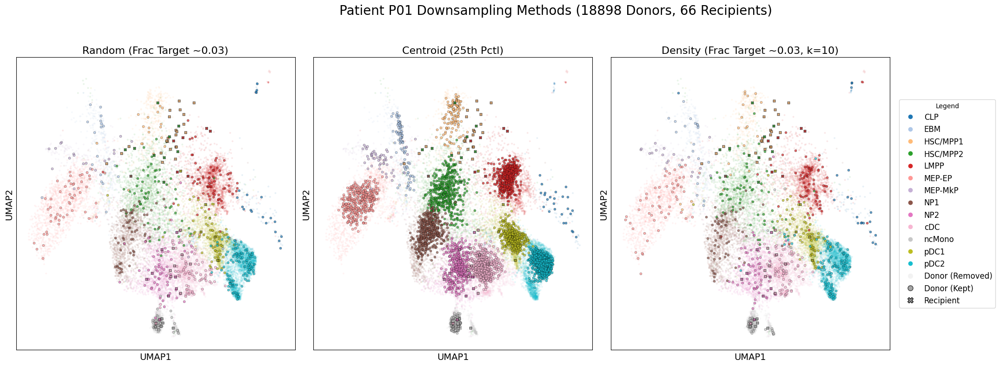


--- Processing Patient: P02 ---
  Patient P02: 2055 Donors, 275 Recipients.
  Calculating downsampling masks (TargetFrac ~1.00, MinCells=15)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


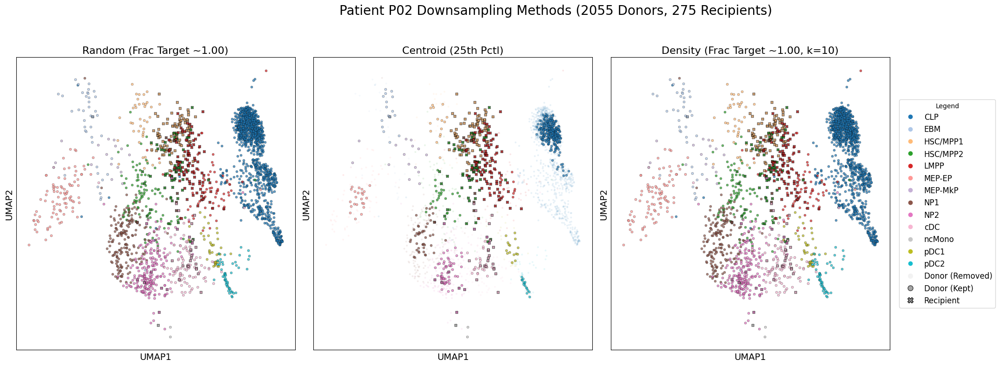


--- Processing Patient: P03 ---
  Patient P03: 3279 Donors, 759 Recipients.
  Calculating downsampling masks (TargetFrac ~1.00, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


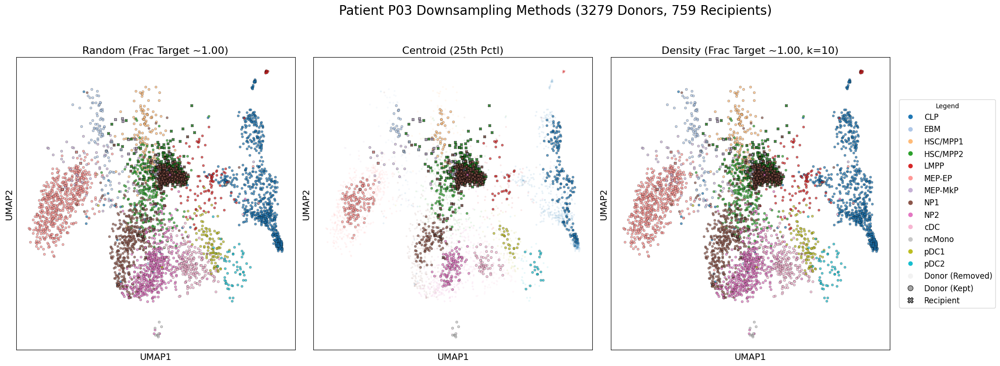


--- Processing Patient: P04 ---
  Patient P04: 1012 Donors, 116 Recipients.
  Calculating downsampling masks (TargetFrac ~1.00, MinCells=8)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


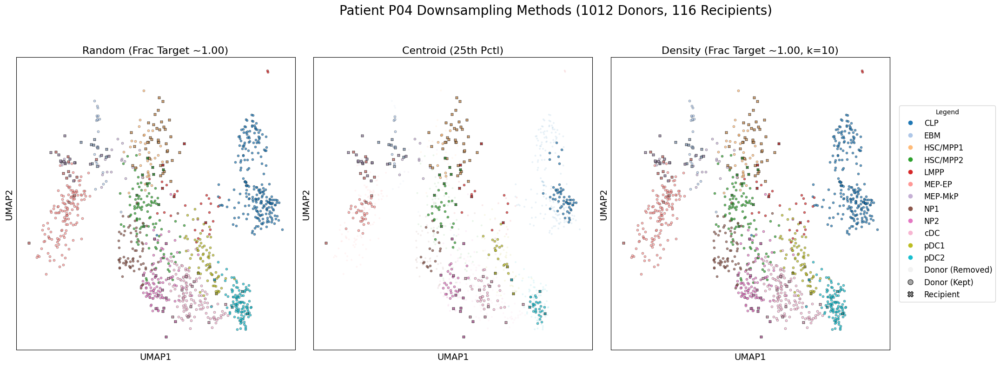


--- Processing Patient: P05 ---
  Patient P05: 4341 Donors, 18 Recipients.
  Calculating downsampling masks (TargetFrac ~0.04, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


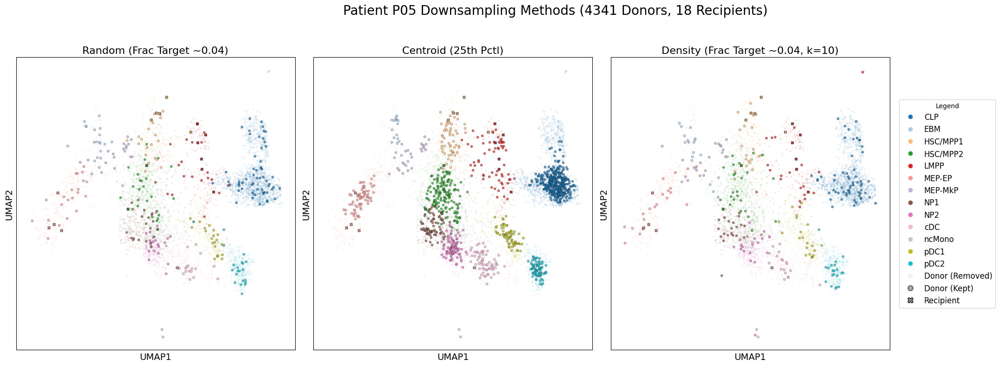


--- Processing Patient: P06 ---
  Patient P06: 3214 Donors, 45 Recipients.
  Calculating downsampling masks (TargetFrac ~0.14, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


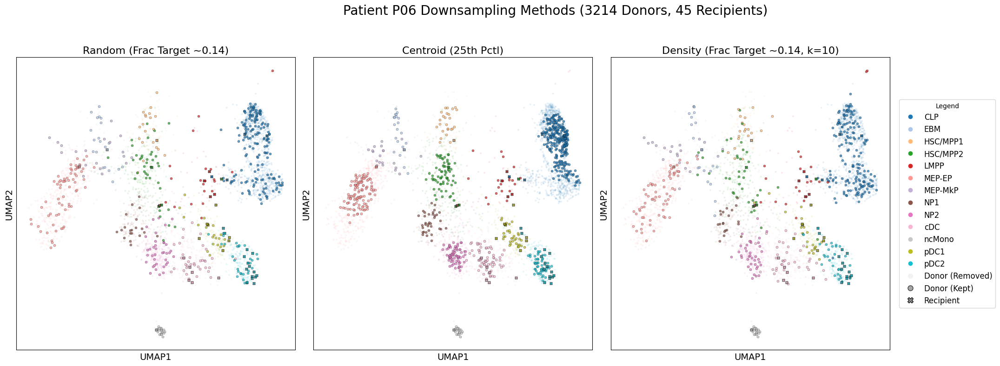


--- Processing Patient: P07 ---
  Patient P07: 2163 Donors, 22 Recipients.
  Calculating downsampling masks (TargetFrac ~0.10, MinCells=16)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


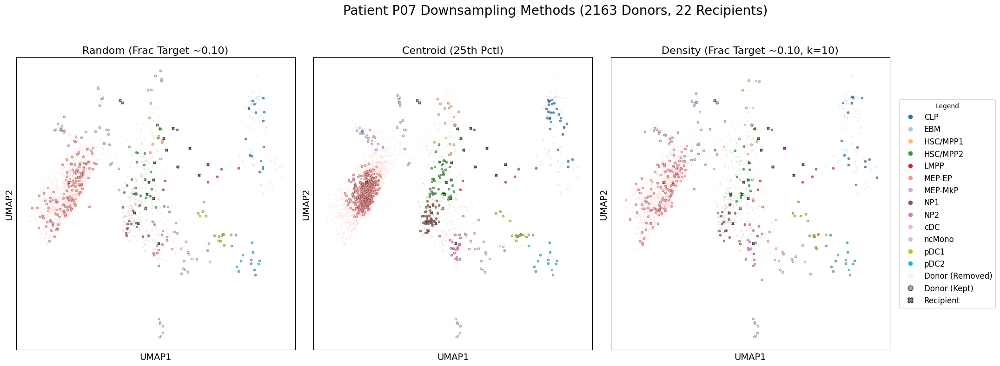


--- Processing Patient: P08 ---
  Patient P08: 1411 Donors, 0 Recipients.
  Calculating downsampling masks (TargetFrac ~0.50, MinCells=10)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


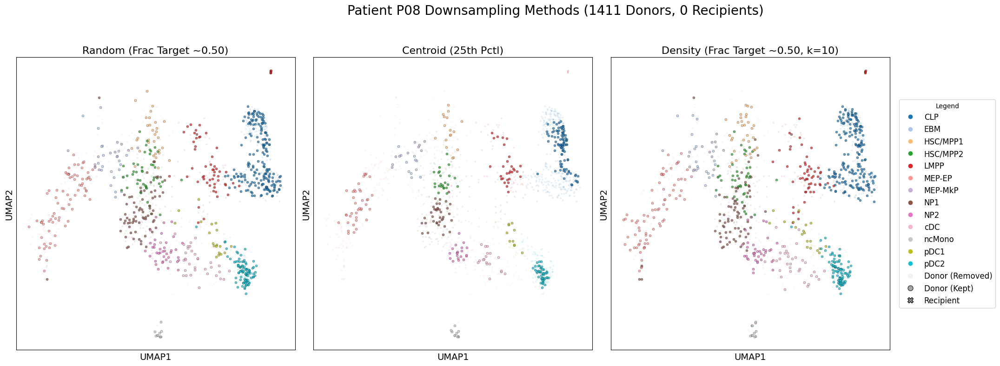


--- Processing Patient: P09 ---
  Patient P09: 16745 Donors, 381 Recipients.
  Calculating downsampling masks (TargetFrac ~0.23, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


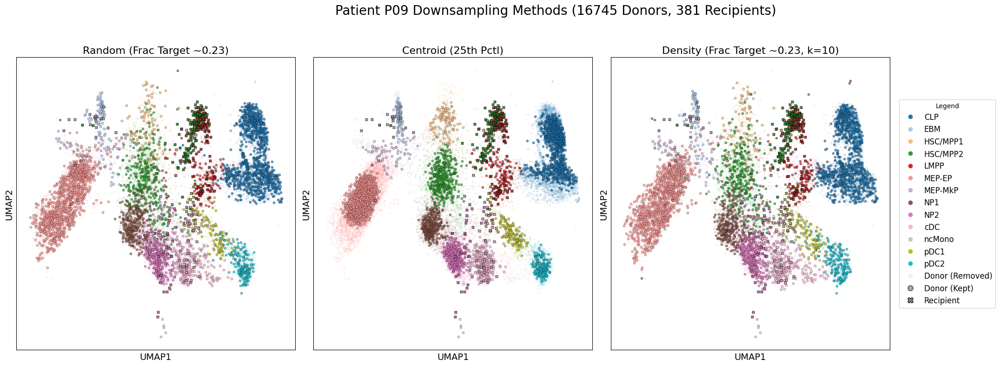


--- Processing Patient: P10 ---
  Patient P10: 2715 Donors, 0 Recipients.
  Calculating downsampling masks (TargetFrac ~0.50, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


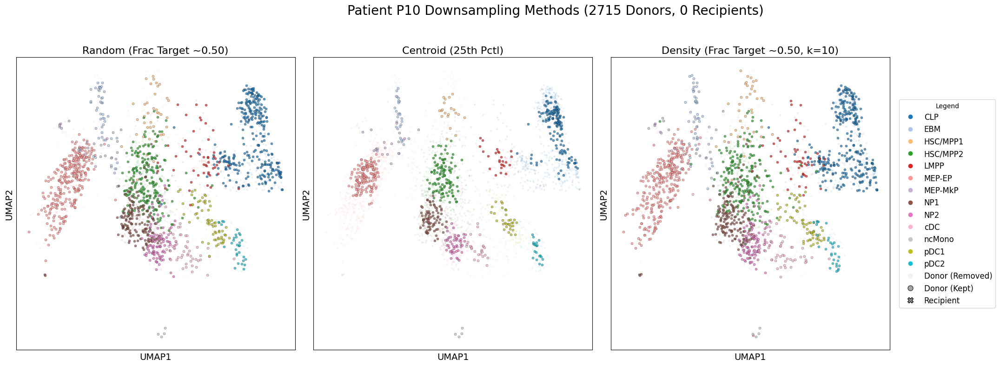


--- Processing Patient: P11 ---
  Patient P11: 4024 Donors, 0 Recipients.
  Calculating downsampling masks (TargetFrac ~0.50, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


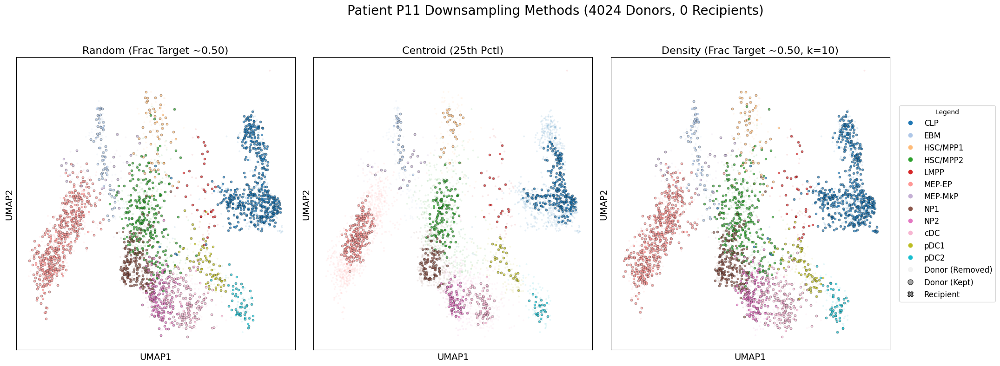


--- Processing Patient: P12 ---
  Patient P12: 2488 Donors, 0 Recipients.
  Calculating downsampling masks (TargetFrac ~0.50, MinCells=19)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


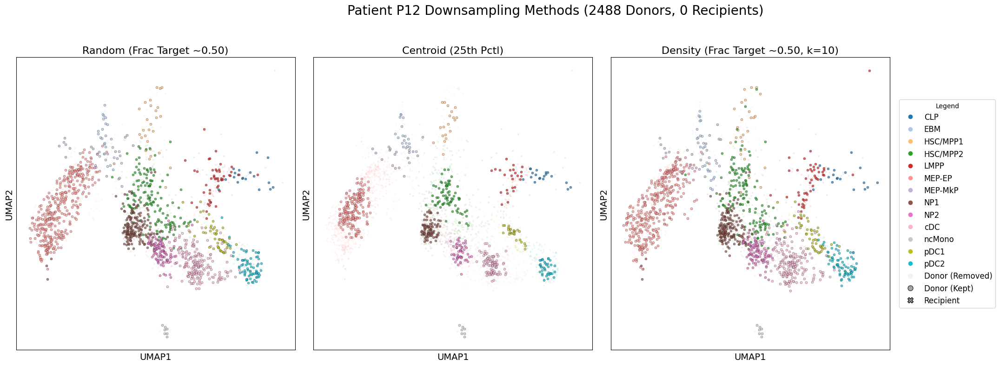


--- Processing Patient: P13 ---
  Patient P13: 5769 Donors, 5 Recipients.
  Calculating downsampling masks (TargetFrac ~0.01, MinCells=20)...
  Plotting Random...
  Plotting Centroid-Percentile...
  Plotting Density-Biased...


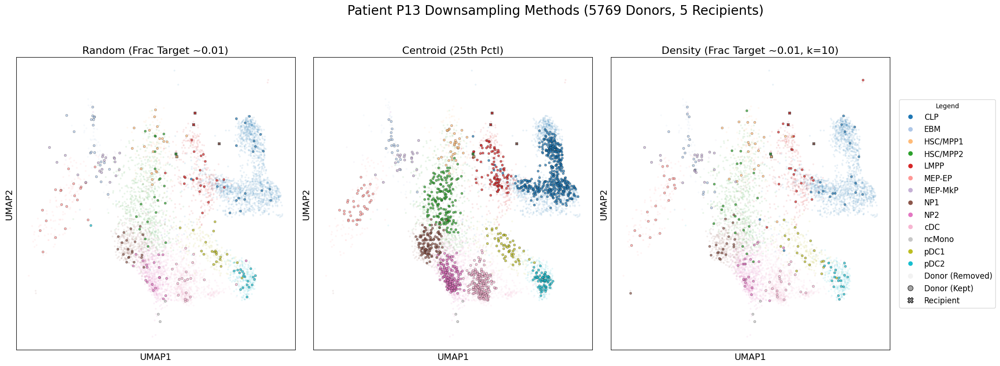


Per-patient combined downsampling plotting finished.


In [17]:
unique_patients = sorted(adata_mrd_preprocessed.obs[PATIENT_COL].unique())
# Generate a consistent color palette for all plots for this run
all_cell_types_overall = sorted(adata_mrd_preprocessed.obs[CELL_TYPE_COL].astype(str).unique())
global_palette = {ctype: plt.cm.get_cmap('tab20' if len(all_cell_types_overall) <= 20 else 'viridis')(i / len(all_cell_types_overall)) 
                   for i, ctype in enumerate(all_cell_types_overall)}


for patient_id in unique_patients:
    print(f"\n--- Processing Patient: {patient_id} ---")
    adata_patient = adata_mrd_preprocessed[adata_mrd_preprocessed.obs[PATIENT_COL] == patient_id].copy()

    if adata_patient.n_obs == 0:
        print(f"  No cells for patient {patient_id}. Skipping.")
        continue

    all_donors_in_patient_mask = (adata_patient.obs[DONOR_RECIPIENT_COL] == DONOR_LABEL)
    adata_donor_patient = adata_patient[all_donors_in_patient_mask].copy()
    
    n_donor_patient_total = adata_donor_patient.n_obs
    n_recipient_patient_total = adata_patient.n_obs - n_donor_patient_total
    d_r_cell_counts_str = f'{n_donor_patient_total} Donors, {n_recipient_patient_total} Recipients'
    print(f"  Patient {patient_id}: {d_r_cell_counts_str}.")
    
    if n_donor_patient_total == 0:
        print(f"  No donor cells for patient {patient_id} to downsample.")
        # Optionally plot just the original state for this patient if desired
        # fig_single, ax_single = plt.subplots(1,1, figsize=(10,8))
        # plot_downsampling_effect_umap(adata_patient, all_donors_in_patient_mask, 
        #                               pd.Series(dtype=bool, index=adata_donor_patient.obs.index), # Empty kept mask
        #                               CELL_TYPE_COL, umap_basis=UMAP_BASIS, 
        #                               title_suffix=f"Original State", ax_to_plot_on=ax_single, show_legend=True, palette=global_palette)
        # fig_single.suptitle(f"Patient {patient_id} - No Donors to Downsample ({d_r_cell_counts_str})", fontsize=14)
        # plt.tight_layout(rect=[0, 0, 0.82, 1])
        # plt.show()
        # plt.close(fig_single)
        continue

    # Determine patient-specific target fraction (using your existing logic)
    patient_target_fraction = DEFAULT_TARGET_DONOR_FRACTION 
    if n_recipient_patient_total > 0:
        current_donor_recipient_ratio = n_donor_patient_total / n_recipient_patient_total
        if current_donor_recipient_ratio <= TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD:
            patient_target_fraction = 1.0
        else:
            target_n_donors = int(n_recipient_patient_total * TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD)
            if n_donor_patient_total > 0:
                 patient_target_fraction = target_n_donors / n_donor_patient_total
                 patient_target_fraction = max(0, min(1.0, patient_target_fraction))
    elif n_donor_patient_total > 0:
        patient_target_fraction = DEFAULT_TARGET_DONOR_FRACTION
    
    num_donor_cell_types = len(adata_donor_patient.obs[CELL_TYPE_COL].unique())
    adaptive_min_cells = 1
    if num_donor_cell_types > 0 and n_donor_patient_total > 0 :
        adaptive_min_cells = max(1, min(MIN_CELLS_PER_TYPE_AFTER_DOWNSAMPLE, int(0.1 * n_donor_patient_total / num_donor_cell_types)))
    
    # --- Calculate all downsampling masks first ---
    print(f"  Calculating downsampling masks (TargetFrac ~{patient_target_fraction:.2f}, MinCells={adaptive_min_cells})...")
    kept_random_mask = random_downsample(
        adata_donor_patient, CELL_TYPE_COL, target_fraction=patient_target_fraction, min_cells_per_type=adaptive_min_cells
    )
    kept_centroid_mask = centroid_percentile_downsample(
        adata_donor_patient, CELL_TYPE_COL, distance_percentile_to_keep=CENTROID_DISTANCE_PERCENTILE, 
        basis=MULTIVI_BASIS, min_cells_per_type=adaptive_min_cells
    )
    adaptive_k = min(DENSITY_K_NEIGHBORS, adata_donor_patient.n_obs - 1 if adata_donor_patient.n_obs > 1 else 1)
    adaptive_k = max(1, adaptive_k)
    kept_density_mask = density_biased_downsample(
        adata_donor_patient, CELL_TYPE_COL, target_fraction=patient_target_fraction, 
        k_neighbors=adaptive_k, density_power=DENSITY_POWER, basis=MULTIVI_BASIS, 
        min_cells_per_type=adaptive_min_cells
    )

    # --- Create 1x3 Subplot Figure ---
    fig, axes = plt.subplots(1, 3, figsize=(24, 8)) # Adjust figsize as needed
    fig.patch.set_facecolor('white')

    plot_methods = [
        ("Random", kept_random_mask, f"Random (Frac Target ~{patient_target_fraction:.2f})"),
        ("Centroid-Percentile", kept_centroid_mask, f"Centroid ({CENTROID_DISTANCE_PERCENTILE}th Pctl)"),
        ("Density-Biased", kept_density_mask, f"Density (Frac Target ~{patient_target_fraction:.2f}, k={adaptive_k})")
    ]

    for i, (method_name, kept_mask, subplot_title_suffix) in enumerate(plot_methods):
        print(f"  Plotting {method_name}...")
        plot_downsampling_effect_umap(
            adata_patient, 
            all_donors_in_patient_mask, 
            kept_mask, # This is the mask specific to adata_donor_patient
            CELL_TYPE_COL, 
            umap_basis=UMAP_BASIS, 
            title_suffix=subplot_title_suffix, 
            ax_to_plot_on=axes[i],
            show_legend=(i == len(plot_methods) - 1), # Show legend only on the last plot
            palette=global_palette, # Use consistent global palette
            point_size=8 # Adjust point size for subplots if needed
        )

    fig.suptitle(f"Patient {patient_id} Downsampling Methods ({d_r_cell_counts_str})", fontsize=20) # Adjust y for title position
    plt.tight_layout(rect=[0, 0, 0.9, 0.94]) # Adjust rect to accommodate suptitle and rightmost legend
    
    # Save the combined figure
    # plot_save_path = os.path.join(PLOT_OUTPUT_DIR, f"umap_downsampling_comparison_{patient_id}.png")
    # fig.savefig(plot_save_path, dpi=300, bbox_inches='tight')
    # print(f"  Saved combined downsampling plot to {plot_save_path}")
    
    plt.show()
    plt.close(fig)

print("\nPer-patient combined downsampling plotting finished.")


--- Processing Patient for Random Downsampling Plot: P01 ---
  Patient P01: 18898 Donors, 66 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.03, MinCells=20)...
  Plotting Random Downsampling for P01...


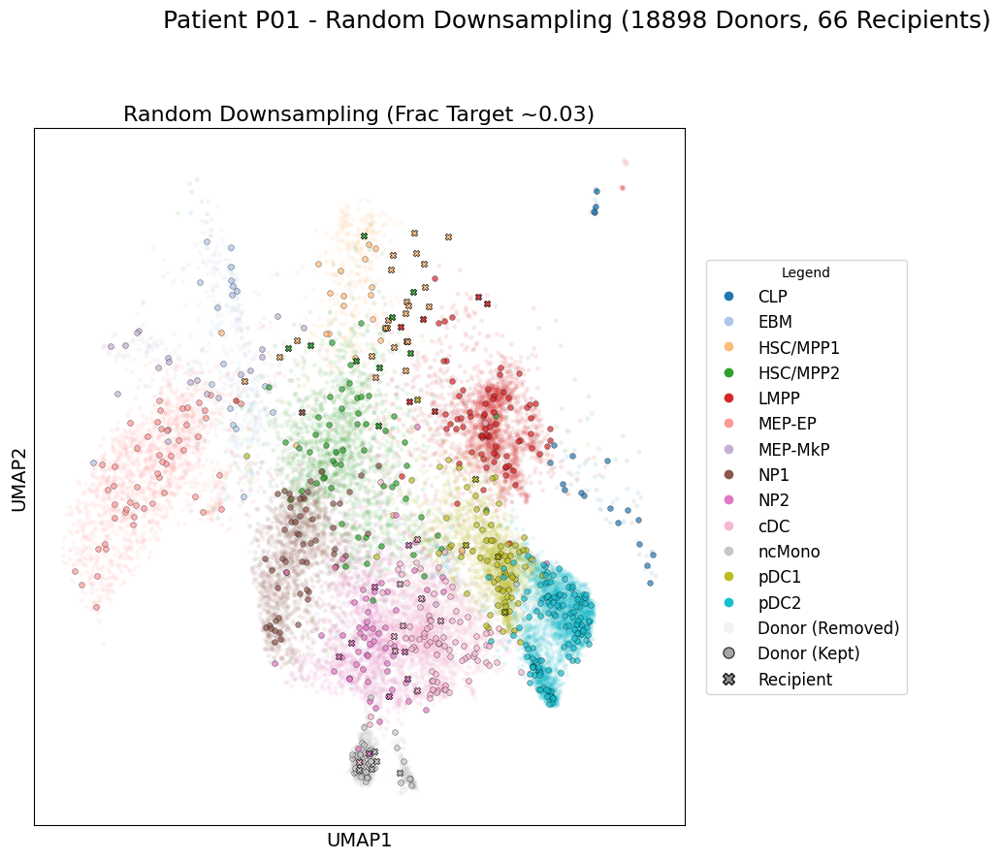


--- Processing Patient for Random Downsampling Plot: P02 ---
  Patient P02: 2055 Donors, 275 Recipients.
  Calculating random downsampling mask (TargetFrac ~1.00, MinCells=15)...
  Plotting Random Downsampling for P02...


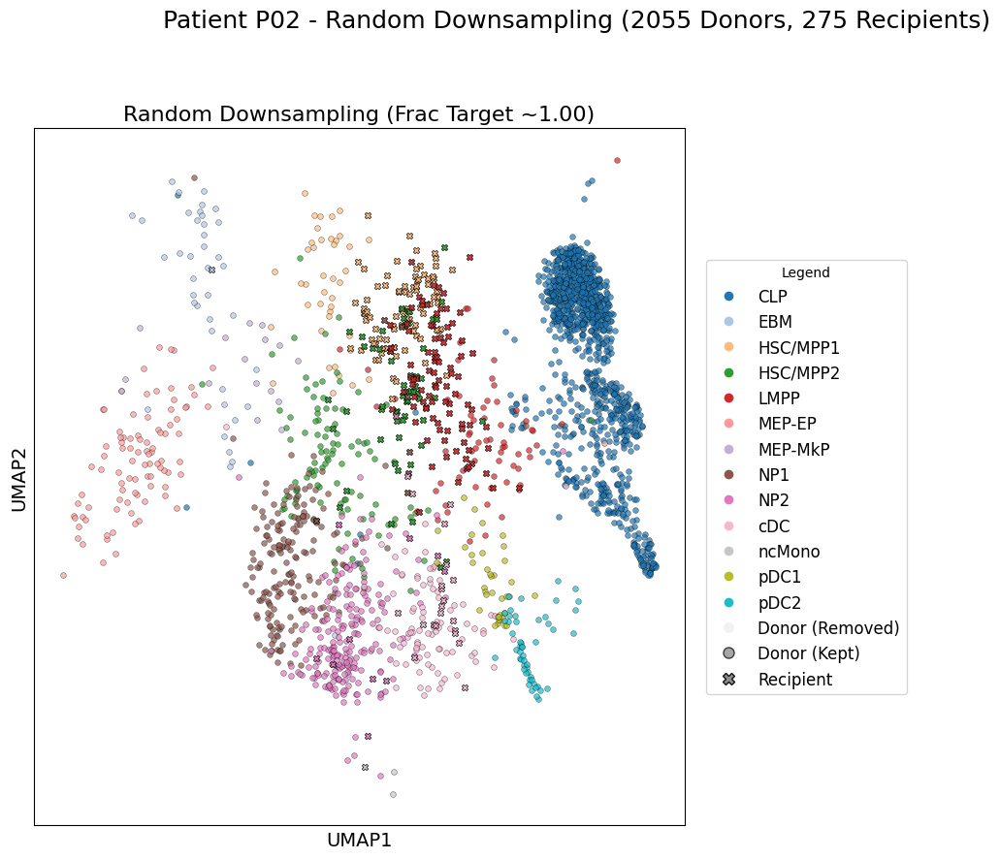


--- Processing Patient for Random Downsampling Plot: P03 ---
  Patient P03: 3279 Donors, 759 Recipients.
  Calculating random downsampling mask (TargetFrac ~1.00, MinCells=20)...
  Plotting Random Downsampling for P03...


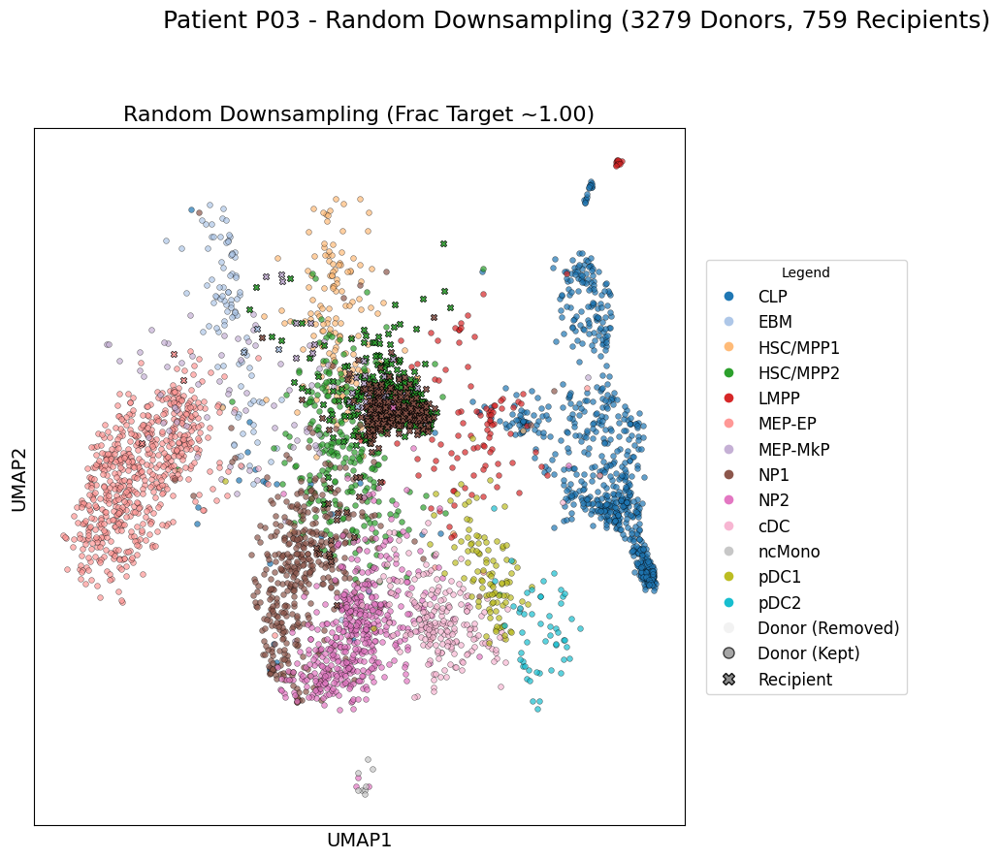


--- Processing Patient for Random Downsampling Plot: P04 ---
  Patient P04: 1012 Donors, 116 Recipients.
  Calculating random downsampling mask (TargetFrac ~1.00, MinCells=8)...
  Plotting Random Downsampling for P04...


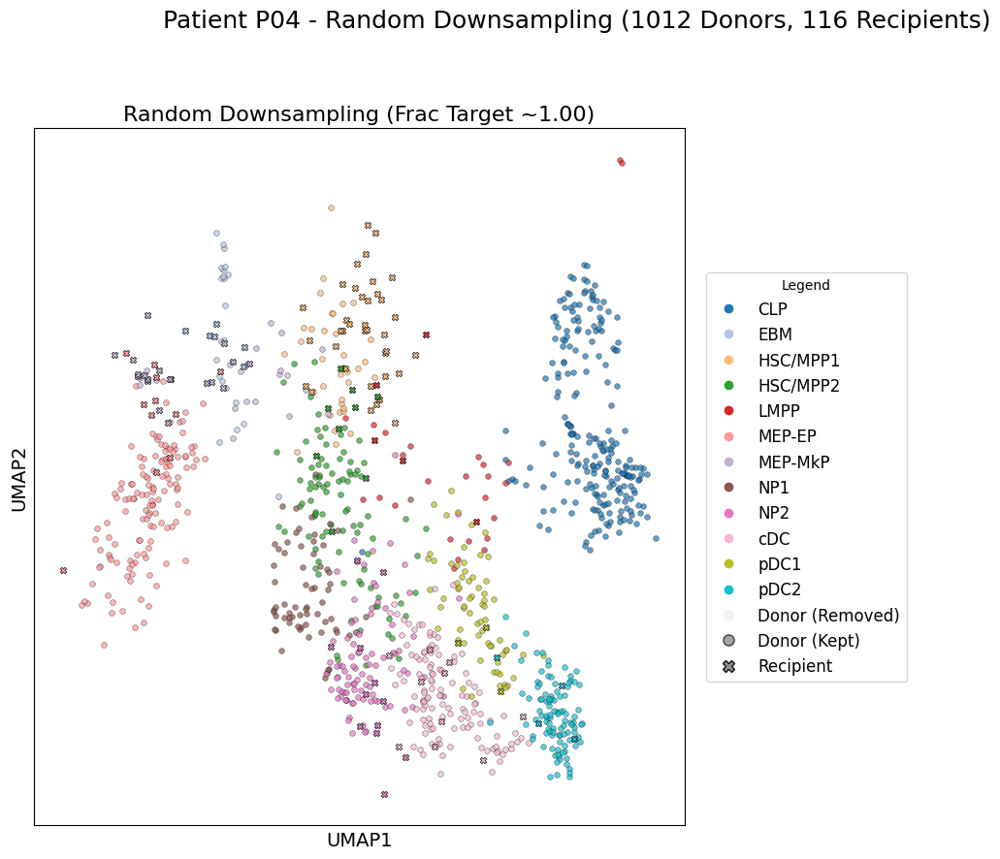


--- Processing Patient for Random Downsampling Plot: P05 ---
  Patient P05: 4341 Donors, 18 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.04, MinCells=20)...
  Plotting Random Downsampling for P05...


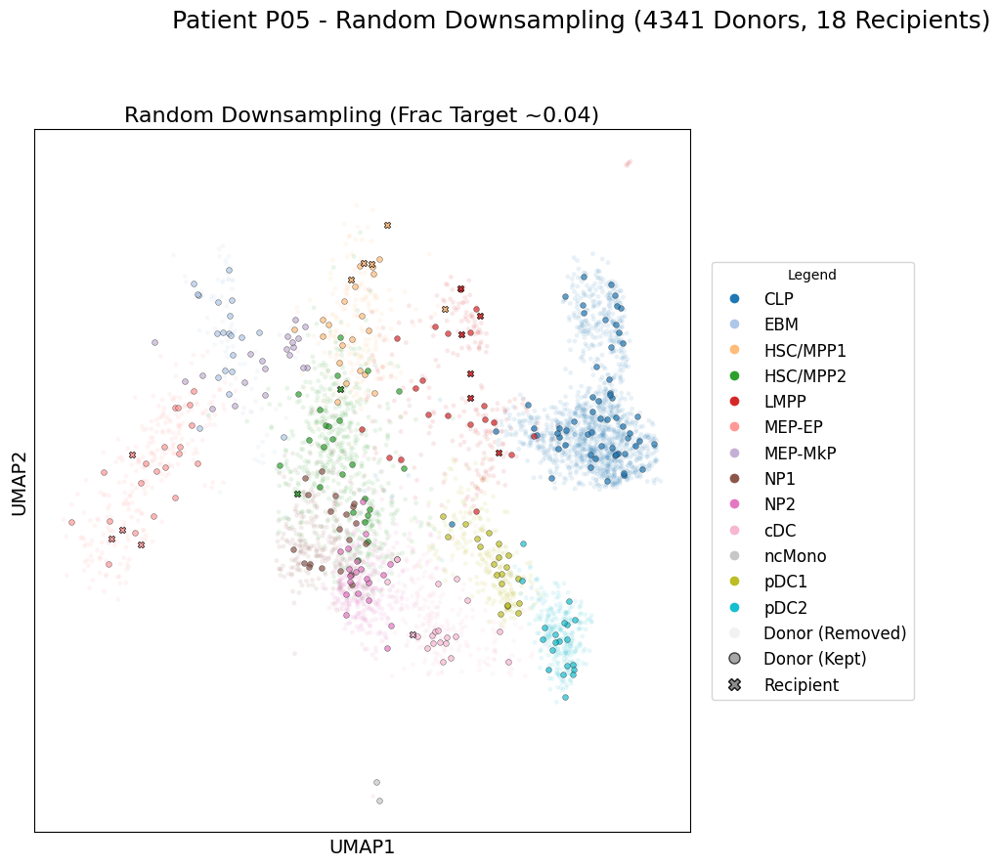


--- Processing Patient for Random Downsampling Plot: P06 ---
  Patient P06: 3214 Donors, 45 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.14, MinCells=20)...
  Plotting Random Downsampling for P06...


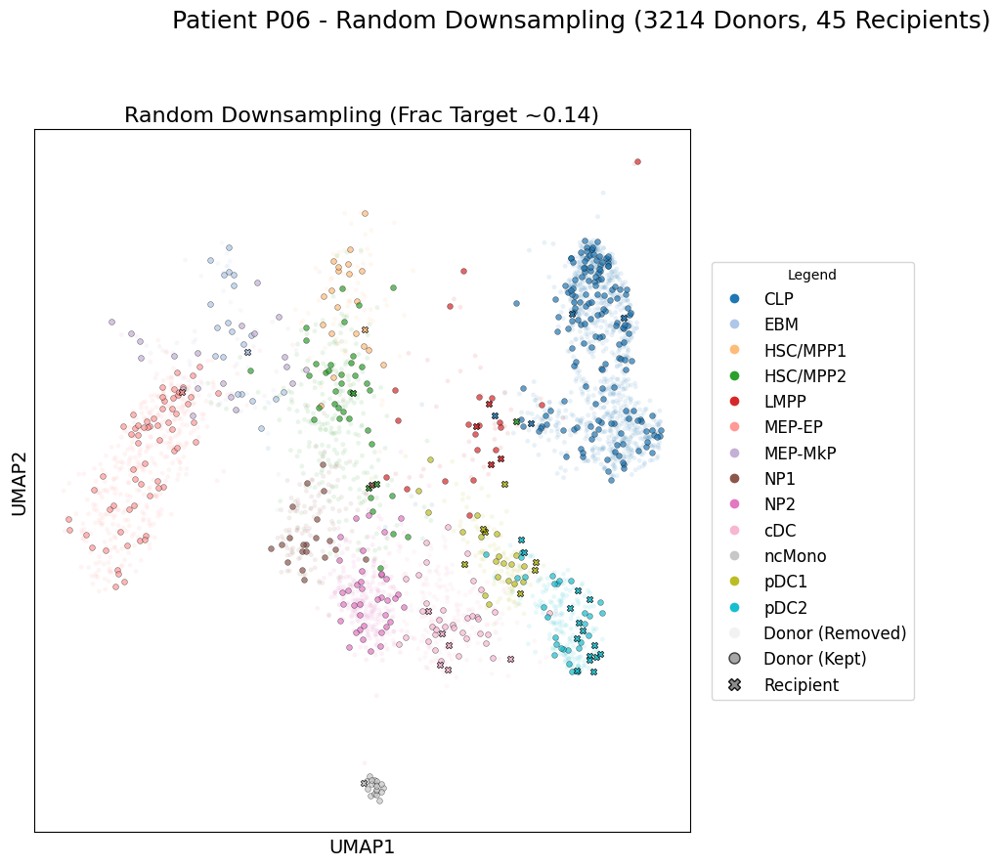


--- Processing Patient for Random Downsampling Plot: P07 ---
  Patient P07: 2163 Donors, 22 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.10, MinCells=16)...
  Plotting Random Downsampling for P07...


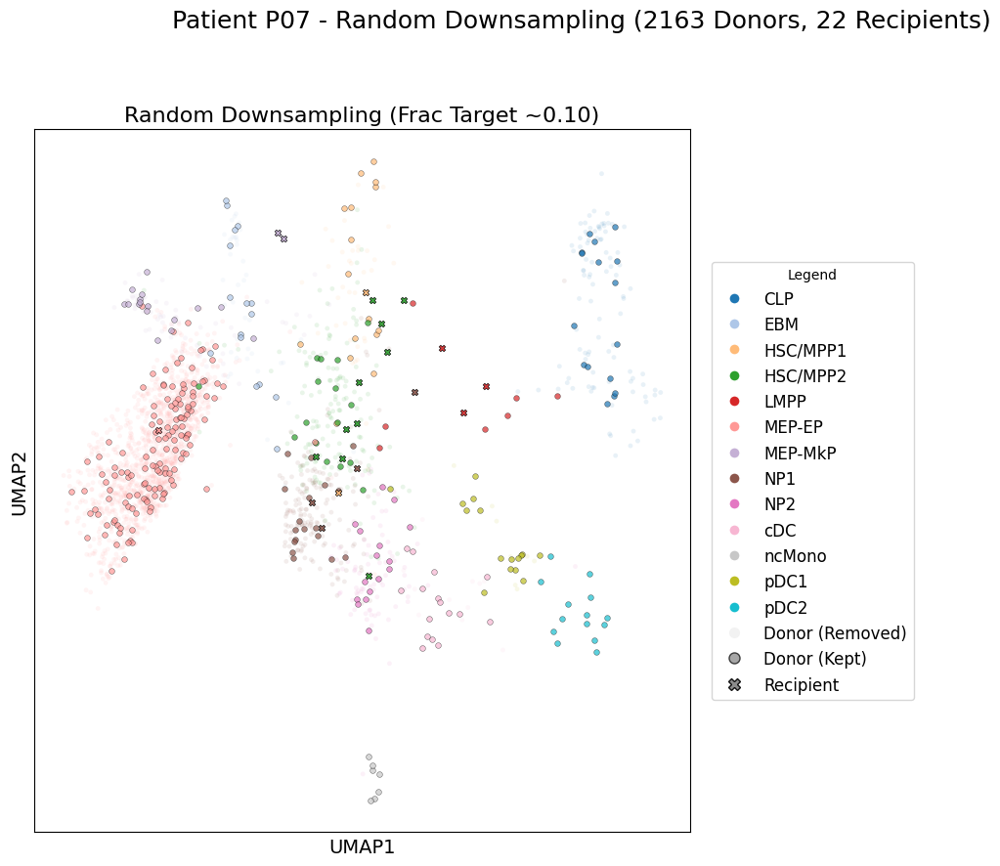


--- Processing Patient for Random Downsampling Plot: P08 ---
  Patient P08: 1411 Donors, 0 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.50, MinCells=10)...
  Plotting Random Downsampling for P08...


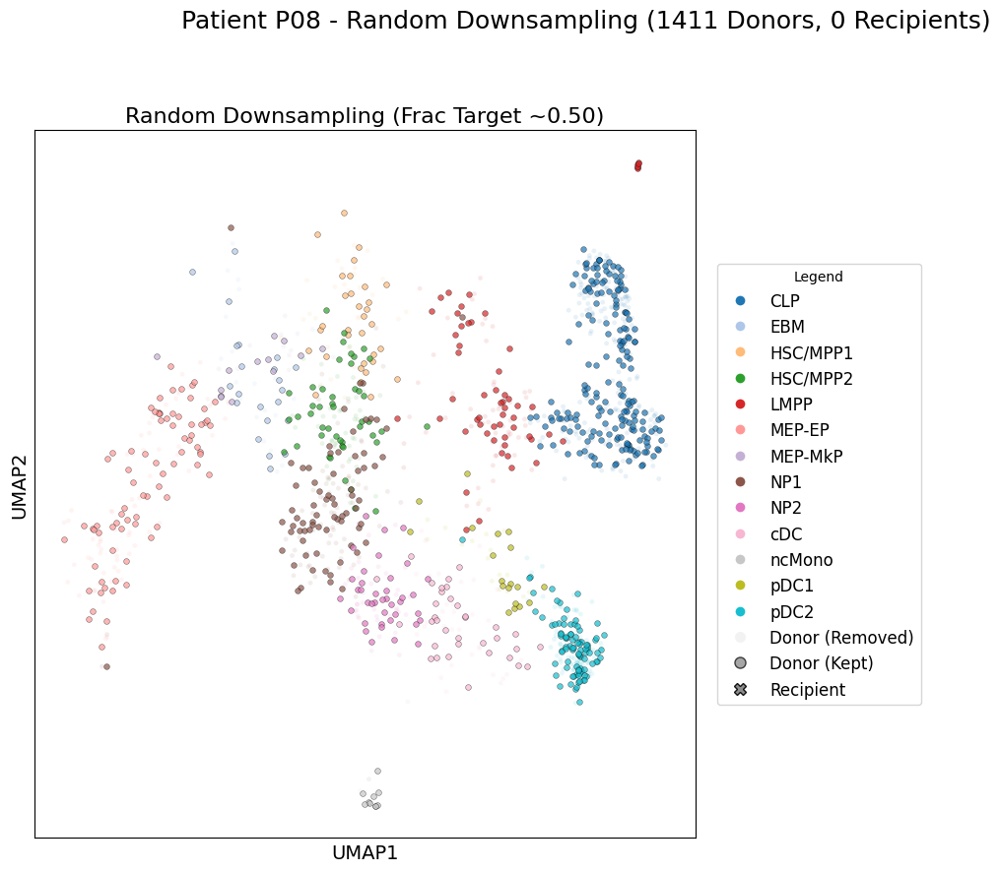


--- Processing Patient for Random Downsampling Plot: P09 ---
  Patient P09: 16745 Donors, 381 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.23, MinCells=20)...
  Plotting Random Downsampling for P09...


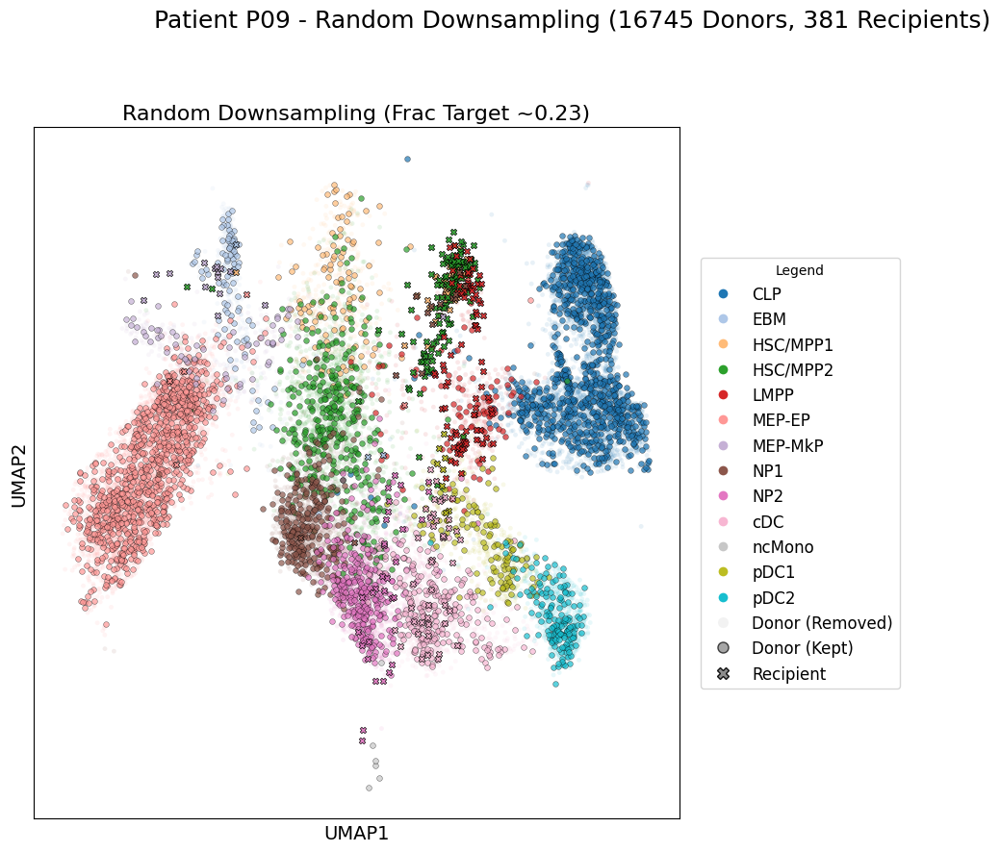


--- Processing Patient for Random Downsampling Plot: P10 ---
  Patient P10: 2715 Donors, 0 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.50, MinCells=20)...
  Plotting Random Downsampling for P10...


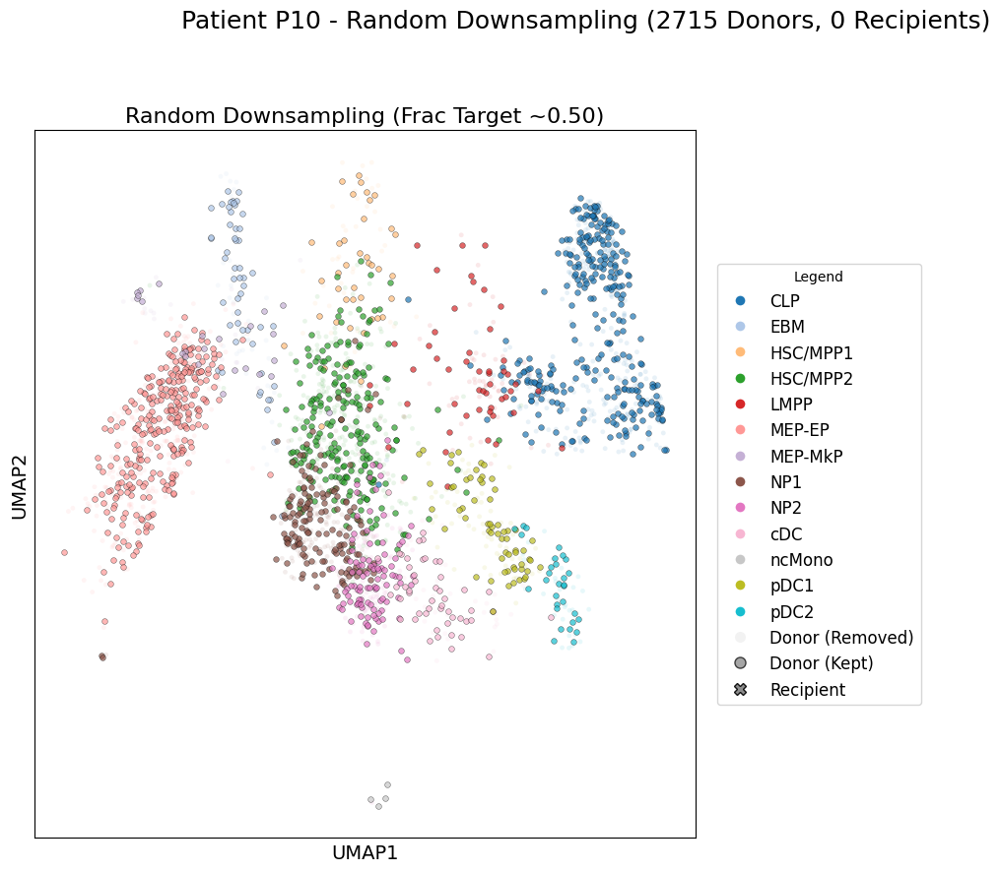


--- Processing Patient for Random Downsampling Plot: P11 ---
  Patient P11: 4024 Donors, 0 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.50, MinCells=20)...
  Plotting Random Downsampling for P11...


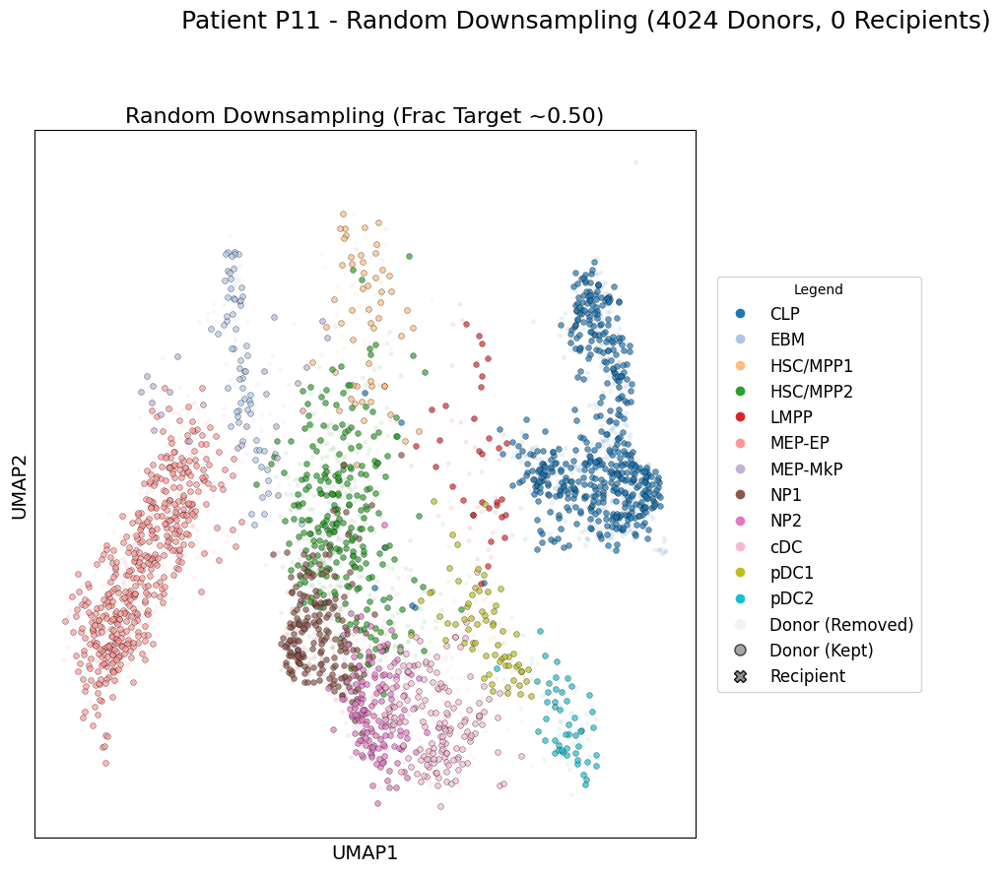


--- Processing Patient for Random Downsampling Plot: P12 ---
  Patient P12: 2488 Donors, 0 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.50, MinCells=19)...
  Plotting Random Downsampling for P12...


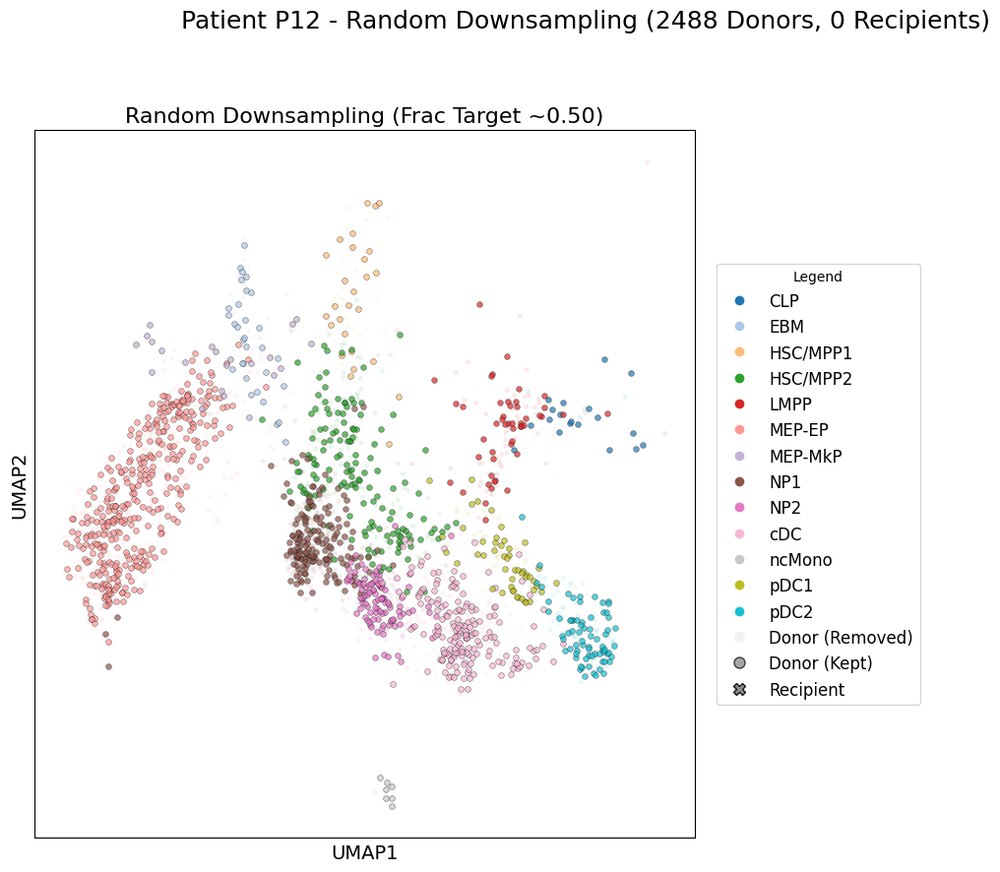


--- Processing Patient for Random Downsampling Plot: P13 ---
  Patient P13: 5769 Donors, 5 Recipients.
  Calculating random downsampling mask (TargetFrac ~0.01, MinCells=20)...
  Plotting Random Downsampling for P13...


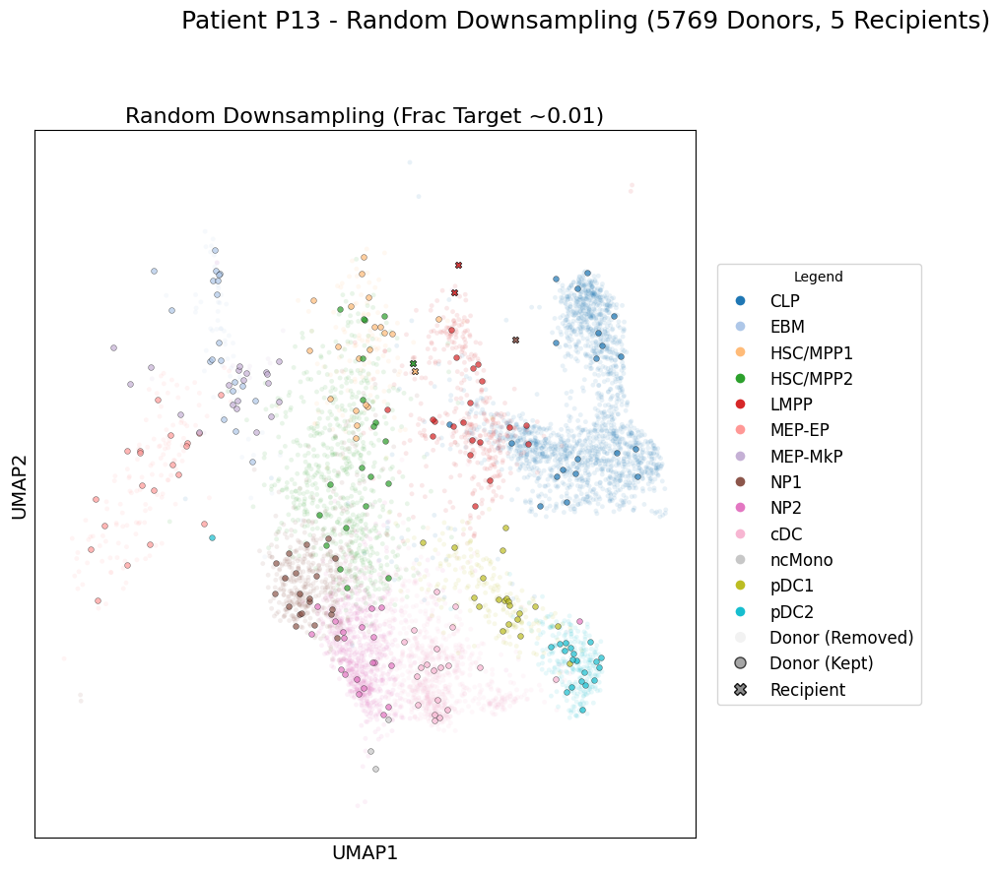


Per-patient single random downsampling plotting finished.


In [18]:
patients_to_plot_random = unique_patients # Or loop through all patients if desired

for patient_id in patients_to_plot_random:
    print(f"\n--- Processing Patient for Random Downsampling Plot: {patient_id} ---")
    adata_patient = adata_mrd_preprocessed[adata_mrd_preprocessed.obs[PATIENT_COL] == patient_id].copy()

    if adata_patient.n_obs == 0:
        print(f"  No cells for patient {patient_id}. Skipping.")
        continue

    all_donors_in_patient_mask = (adata_patient.obs[DONOR_RECIPIENT_COL] == DONOR_LABEL)
    adata_donor_patient = adata_patient[all_donors_in_patient_mask].copy()
    
    n_donor_patient_total = adata_donor_patient.n_obs
    n_recipient_patient_total = adata_patient.n_obs - n_donor_patient_total
    d_r_cell_counts_str = f'{n_donor_patient_total} Donors, {n_recipient_patient_total} Recipients'
    print(f"  Patient {patient_id}: {d_r_cell_counts_str}.")
    
    if n_donor_patient_total == 0:
        print(f"  No donor cells for patient {patient_id} to downsample for random plot.")
        # You could plot the original state here if you wanted, similar to your main loop's handling
        continue

    # Determine patient-specific target fraction (same logic as your main script)
    patient_target_fraction = DEFAULT_TARGET_DONOR_FRACTION 
    if n_recipient_patient_total > 0:
        current_donor_recipient_ratio = n_donor_patient_total / n_recipient_patient_total
        if current_donor_recipient_ratio <= TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD:
            patient_target_fraction = 1.0
        else:
            target_n_donors = int(n_recipient_patient_total * TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD)
            if n_donor_patient_total > 0:
                patient_target_fraction = target_n_donors / n_donor_patient_total
                patient_target_fraction = max(0, min(1.0, patient_target_fraction))
    elif n_donor_patient_total > 0: # Only donors, no recipients
        patient_target_fraction = DEFAULT_TARGET_DONOR_FRACTION
    
    num_donor_cell_types = len(adata_donor_patient.obs[CELL_TYPE_COL].unique())
    adaptive_min_cells = 1
    if num_donor_cell_types > 0 and n_donor_patient_total > 0:
        # Ensure adaptive_min_cells doesn't exceed total cells of a type or overall donor count
        # A simple approach here, but you might refine it based on per-type counts.
        adaptive_min_cells = max(1, min(MIN_CELLS_PER_TYPE_AFTER_DOWNSAMPLE, 
                                       int(0.1 * n_donor_patient_total / num_donor_cell_types if num_donor_cell_types > 0 else n_donor_patient_total)))


    print(f"  Calculating random downsampling mask (TargetFrac ~{patient_target_fraction:.2f}, MinCells={adaptive_min_cells})...")
    kept_random_mask_single = random_downsample(
        adata_donor_patient, 
        CELL_TYPE_COL, 
        target_fraction=patient_target_fraction, 
        min_cells_per_type=adaptive_min_cells
    )

    # --- Create Single Plot Figure for Random Downsampling ---
    # Adjust figsize for a single plot. (width, height)
    fig_single_random, ax_single_random = plt.subplots(1, 1, figsize=(12, 9)) # Larger for a single plot
    fig_single_random.patch.set_facecolor('white')

    print(f"  Plotting Random Downsampling for {patient_id}...")
    plot_downsampling_effect_umap(
        adata_patient, 
        all_donors_in_patient_mask, 
        kept_random_mask_single, 
        CELL_TYPE_COL, 
        umap_basis=UMAP_BASIS, 
        title_suffix=f"Random Downsampling (Frac Target ~{patient_target_fraction:.2f})", 
        ax_to_plot_on=ax_single_random,
        show_legend=True, # Show legend for this single plot
        palette=global_palette,
        point_size=12 # Potentially larger points for a single plot
    )

    fig_single_random.suptitle(f"Patient {patient_id} - Random Downsampling ({d_r_cell_counts_str})", fontsize=18) # Adjusted fontsize
    
    # Adjust layout for the single plot with legend. 
    # The rect might need to be different than the 1x3 plot if the legend size/position changes relative to a single plot.
    # If legend is to the right (bbox_to_anchor=(1.02, 0.5)), you need space on the right.
    plt.tight_layout(rect=[0, 0, 0.80, 0.93]) # Example: rect=[left, bottom, right, top] - reserves 20% on right for legend

    # Save the figure
    # plot_save_path_single = os.path.join(PLOT_OUTPUT_DIR, f"umap_random_downsampling_{patient_id}.png")
    # fig_single_random.savefig(plot_save_path_single, dpi=300, bbox_inches='tight')
    # print(f"  Saved random downsampling plot to {plot_save_path_single}")
    
    plt.show()
    plt.close(fig_single_random)

print("\nPer-patient single random downsampling plotting finished.")